In [1]:
!pip freeze > ../requirements.txt

The process cannot access the file because it is being used by another process.


In [2]:
import os
import sys
sys.path.append(r'..')

import pandas as pd
from scripts.data_analysis import *
from scripts.visualization import *
from scripts.financial_analysis import *
from scripts.data_transformation import *

c:\Users\Darkles\10academy\10Academy-Kifiya-Week-1\env\Lib\site-packages\pyfolio\pos.py:25: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Darkles\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Darkles\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Darkles\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Darkles\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
datasets_folder = r"../datasets/raw/yfinance_data"
dataset_name = "TSLA_historical_data.csv"
dataset_path = os.path.join(datasets_folder, dataset_name)

df_TSLA = load_data(dataset_path)
# df_TSLA['Date'] = pd.to_datetime(df_TSLA['Date'])
df = clean_stock_data(df_TSLA)
# df, _ = clean_and_preprocess_data(df, date_column="Date")
df

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
Date,,,,,,,,,
2010-06-29,2010-06-29,1.266667,1.666667,1.169333,1.592667,1.592667,281494500,0.0,0.0
2010-06-30,2010-06-30,1.719333,2.028000,1.553333,1.588667,1.588667,257806500,0.0,0.0
2010-07-01,2010-07-01,1.666667,1.728000,1.351333,1.464000,1.464000,123282000,0.0,0.0
2010-07-02,2010-07-02,1.533333,1.540000,1.247333,1.280000,1.280000,77097000,0.0,0.0
2010-07-06,2010-07-06,1.333333,1.333333,1.055333,1.074000,1.074000,103003500,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2024-07-24,2024-07-24,225.419998,225.990005,214.710007,215.990005,215.990005,167942900,0.0,0.0
2024-07-25,2024-07-25,216.800003,226.000000,216.229996,220.250000,220.250000,100636500,0.0,0.0
2024-07-26,2024-07-26,221.190002,222.279999,215.330002,219.800003,219.800003,94604100,0.0,0.0


In [4]:
# Summarize the data
summary = summarize_data(df)

# Print the summary in a more presentable format
print("Dataset Summary:")
print(f"Shape: {summary['shape']}")
print("\nMissing Values:")
for column, missing in summary['missing_values'].items():
    print(f"{column}: {missing}")

print("\nDuplicates:")
print(summary['duplicates'])

print("\nUnique Values:")
for column, unique in summary['unique_values'].items():
    print(f"{column}: {unique}")

print("\nColumn Statistics:")
for column, stats in summary['column_stats'].items():
    print(f"\n{column}:")
    for stat, value in stats.items():
        print(f"  {stat}: {value}")

Dataset Summary:
Shape: (3545, 9)

Missing Values:
Date: 0
Open: 0
High: 0
Low: 0
Close: 0
Adj Close: 0
Volume: 0
Dividends: 0
Stock Splits: 0

Duplicates:
0

Unique Values:
Date: 3545
Open: 3238
High: 3233
Low: 3249
Close: 3343
Adj Close: 3343
Volume: 3514
Dividends: 1
Stock Splits: 3

Column Statistics:

Date:
  count: 3545
  mean: 2017-07-12 17:17:02.623413248
  min: 2010-06-29 00:00:00
  25%: 2014-01-06 00:00:00
  50%: 2017-07-13 00:00:00
  75%: 2021-01-20 00:00:00
  max: 2024-07-30 00:00:00
  std: nan

Open:
  count: 3545.0
  mean: 75.50565794250693
  min: 1.0759999752044678
  25%: 11.516667366027832
  50%: 17.463333129882812
  75%: 161.8800048828125
  max: 411.4700012207031
  std: 102.53048863542944

High:
  count: 3545.0
  mean: 77.15923719201001
  min: 1.108667016029358
  25%: 11.861332893371582
  50%: 17.68866729736328
  75%: 165.3333282470703
  max: 414.4966735839844
  std: 104.80651601544054

Low:
  count: 3545.0
  mean: 73.7434918110058
  min: 0.9986670017242432
  25%: 11.2

In [5]:
indicators = calculate_technical_indicators(df)

# [df.__setitem__(indicator, values) for indicator, values in indicators.items()]
for indicator, values in indicators.items():
    df[indicator] = values
df

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,SMA,...,MACD_Hist,WMA,BB_upper,BB_middle,BB_lower,ATR,ADX,CCI,ROC,MACD_hist
Date,,,,,,,,,,,,,,,,,,,,,
2010-06-29,2010-06-29,1.266667,1.666667,1.169333,1.592667,1.592667,281494500,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-06-30,2010-06-30,1.719333,2.028000,1.553333,1.588667,1.588667,257806500,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-07-01,2010-07-01,1.666667,1.728000,1.351333,1.464000,1.464000,123282000,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-07-02,2010-07-02,1.533333,1.540000,1.247333,1.280000,1.280000,77097000,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-07-06,2010-07-06,1.333333,1.333333,1.055333,1.074000,1.074000,103003500,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-24,2024-07-24,225.419998,225.990005,214.710007,215.990005,215.990005,167942900,0.0,0.0,237.924999,...,-4.084498,244.060428,280.774991,237.924999,195.075007,13.716958,35.148278,-68.560428,-17.955634,-4.084498
2024-07-25,2024-07-25,216.800003,226.000000,216.229996,220.250000,220.250000,100636500,0.0,0.0,239.118999,...,-5.216466,242.377095,278.457743,239.118999,199.780256,13.452174,33.499176,-74.223168,-8.621333,-5.216466
2024-07-26,2024-07-26,221.190002,222.279999,215.330002,219.800003,219.800003,94604100,0.0,0.0,240.238000,...,-5.814053,240.537190,275.866801,240.238000,204.609199,12.987733,32.028836,-94.528690,-11.453085,-5.814053


# Plotting indicators

In [6]:
plot_indicators(data=df, indicators=['RSI', 'MACD', 'MACD_Signal'], title='Technical Indicators')

In [7]:
plot_indicators(data=df, indicators=['SMA', 'RSI', 'EMA', 'MACD', 'MACD_Signal', 'WMA', 'BB_upper', 'BB_middle', 'BB_lower', 'ATR', 'ADX', 'CCI', 'ROC'], title='Technical Indicators')

In [8]:
plot_indicators(data=df, indicators=['SMA', 'EMA'], title='Simple Moving Average (SMA) vs Exponential Moving Average (EMA)')

In [9]:
plot_indicators(data=df, indicators=['RSI', 'ADX'], title='Relative Strength Index (RSI) vs Average Directional Index (ADX)')

In [10]:
plot_indicators(data=df, indicators=['BB_upper', 'BB_middle', 'BB_lower'], title='Bollinger Bands')

In [11]:
plot_indicators(data=df, indicators=['ATR', 'CCI'], title='Average True Range (ATR) vs Commodity Channel Index (CCI)')

In [12]:
plot_indicators(data=df, indicators=['ROC', 'MACD_hist'], title='Rate of Change (ROC) vs MACD Histogram')

In [13]:
plot_indicators(data=df, indicators = ['MACD', 'MACD_Signal'], title = 'Moving Average Convergence Divergence (MACD)')

In [14]:
plot_indicators(data=df, indicators=['SMA', 'WMA'], title='Simple Moving Average (SMA) vs Weighted Moving Average (WMA)')

In [15]:
plot_indicators(data=df, indicators=['MACD', 'MACD_Signal', 'MACD_hist'], title='MACD vs MACD Signal vs MACD Histogram')

In [16]:
plot_indicators(data=df, indicators=['BB_upper', 'BB_middle', 'BB_lower', 'Close'], title='Bollinger Bands with Close Price')

In [17]:
plot_indicators(data=df, indicators=['ATR', 'Close'], title='Average True Range (ATR) with Close Price')

In [18]:
plot_indicators(data=df, indicators=['CCI', 'Close'], title='Commodity Channel Index (CCI) with Close Price')

In [19]:
plot_indicators(data=df, indicators=['ROC', 'Close'], title='Rate of Change (ROC) with Close Price')

In [20]:
plot_indicators(data=df, indicators=['SMA', 'EMA', 'WMA'], title='Moving Averages (SMA, EMA, WMA)')

In [21]:
plot_indicators(data=df, indicators=['RSI', 'CCI'], title='Relative Strength Index (RSI) vs Commodity Channel Index (CCI)')

In [22]:
plot_indicators(data=df, indicators=['MACD', 'MACD_Signal', 'MACD_hist'], title='MACD vs MACD Signal vs MACD Histogram')

In [23]:
plot_indicators(data=df, indicators=['BB_upper', 'BB_middle', 'BB_lower', 'Close'], title='Bollinger Bands with Close Price')

In [24]:
plot_indicators(data=df, indicators=['ATR', 'Close'], title='Average True Range (ATR) with Close Price')

In [25]:
plot_indicators(data=df, indicators=['ADX', 'Close'], title='Average Directional Index (ADX) with Close Price')

In [26]:
plot_indicators(data=df, indicators=['ROC', 'Close'], title='Rate of Change (ROC) with Close Price')

# Additional

In [27]:
plot_interactive_stock_chart(df, 'Open')

In [28]:
plot_stock_data(df)

In [29]:
plot_stock_data_2(df)

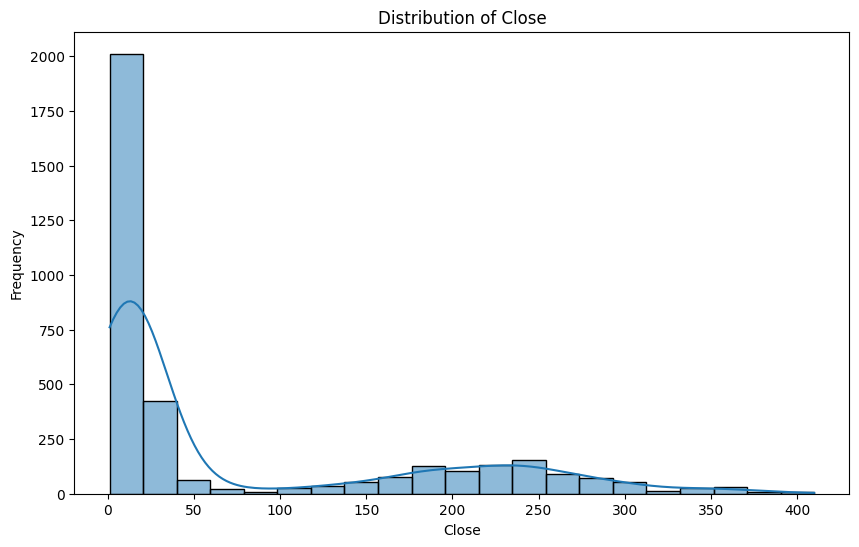

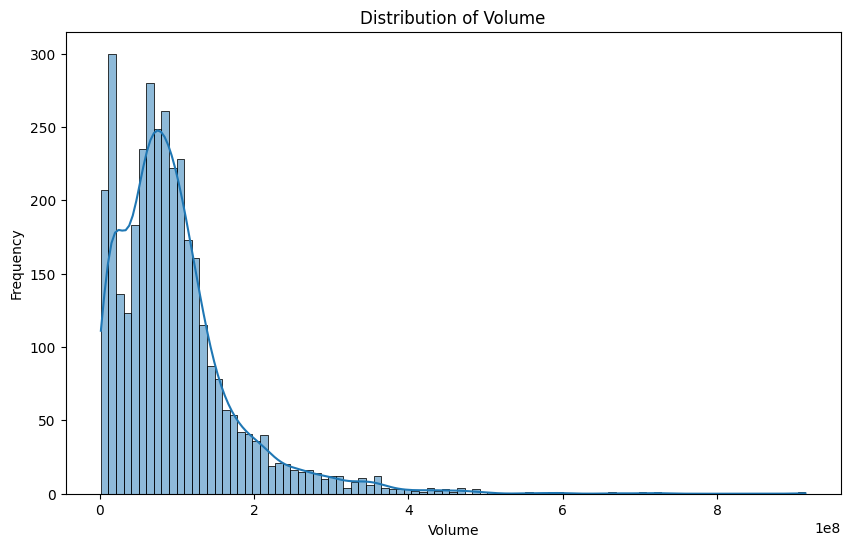

In [30]:
# Plot distributions
plot_distributions(df)

c:\Users\Darkles\10academy\10Academy-Kifiya-Week-1\env\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-14.827%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2010-06-29
End date,2024-07-30
Total months,168
,Backtest
Annual return,-14.827%
Cumulative returns,-89.539%
Annual volatility,26.562%
Sharpe ratio,-0.47
Calmar ratio,-0.16
Stability,0.77
Max drawdown,-93.569%


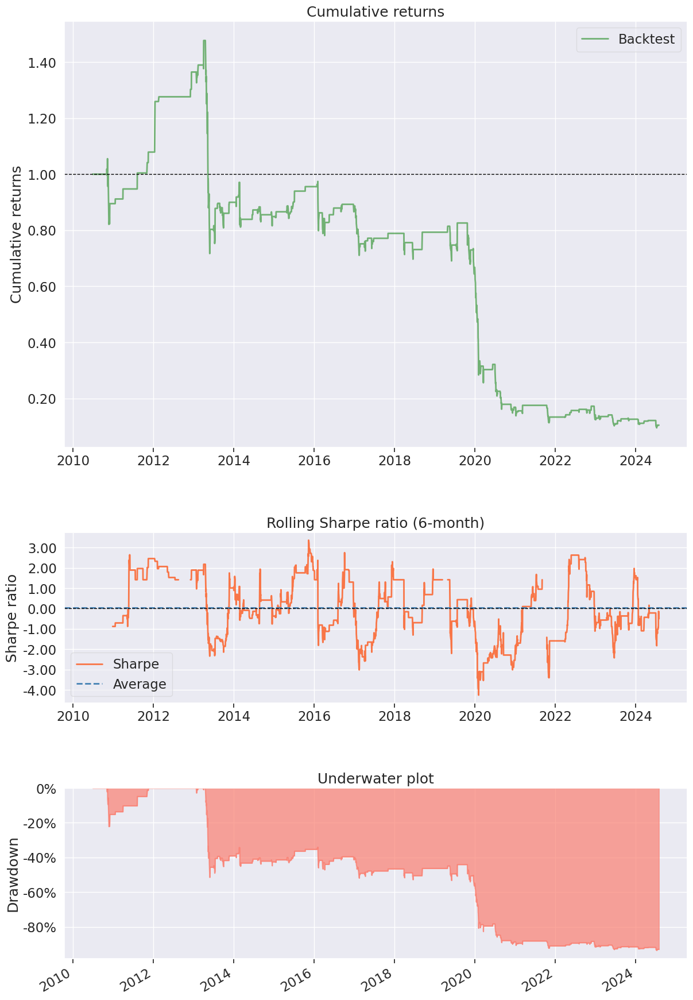

In [31]:
df['Signal'] = generate_signals(df)
df['Daily_Return'] = calculate_daily_return(df)
df['Strategy_Return'] = calculate_strategy_return(df)

create_performance_tear_sheet(df['Strategy_Return'])

In [32]:
# Calculate correlations
correlations = calculate_correlations(df, method="pearson")
correlations

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,SMA,...,BB_middle,BB_lower,ATR,ADX,CCI,ROC,MACD_hist,Signal,Daily_Return,Strategy_Return
Date,1.000000,0.784057,0.784034,0.784619,0.784377,0.784377,0.377148,NaN,0.021986,0.786177,...,0.786177,0.781516,0.749667,0.076247,-0.039828,-0.011417,0.011027,0.035138,-0.003747,-0.024169
Open,0.784057,1.000000,0.999724,0.999626,0.999219,0.999219,0.105546,NaN,0.029343,0.993353,...,0.993353,0.987055,0.950619,0.033855,-0.007449,0.014669,0.010068,0.008300,-0.015196,-0.003360
High,0.784034,0.999724,1.000000,0.999633,0.999650,0.999650,0.109179,NaN,0.030936,0.993243,...,0.993243,0.986490,0.952095,0.035884,-0.005243,0.017629,0.012957,0.005933,-0.006278,-0.005228
Low,0.784619,0.999626,0.999633,1.000000,0.999687,0.999687,0.102287,NaN,0.029330,0.992713,...,0.992713,0.986838,0.947668,0.032227,-0.002494,0.018679,0.016077,0.005595,-0.005315,-0.005834
Close,0.784377,0.999219,0.999650,0.999687,1.000000,1.000000,0.106500,NaN,0.031355,0.992624,...,0.992624,0.986219,0.949582,0.034754,-0.001773,0.021134,0.017296,0.003452,0.004470,-0.007538
Adj Close,0.784377,0.999219,0.999650,0.999687,1.000000,1.000000,0.106500,NaN,0.031355,0.992624,...,0.992624,0.986219,0.949582,0.034754,-0.001773,0.021134,0.017296,0.003452,0.004470,-0.007538
Volume,0.377148,0.105546,0.109179,0.102287,0.106500,0.106500,1.000000,NaN,0.042465,0.093867,...,0.093867,0.072987,0.147072,0.342484,0.091273,0.185784,0.061239,-0.151676,0.082367,-0.099674
Dividends,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Stock Splits,0.021986,0.029343,0.030936,0.029330,0.031355,0.031355,0.042465,NaN,1.000000,0.025409,...,0.025409,0.023153,0.025816,0.026299,0.014354,0.041593,0.018841,-0.034253,0.048350,-0.107559
SMA,0.786177,0.993353,0.993243,0.992713,0.992624,0.992624,0.093867,NaN,0.025409,1.000000,...,1.000000,0.995944,0.960596,0.017430,-0.065870,-0.052528,-0.085646,0.057257,-0.026258,0.003706


In [33]:
# Detect outliers
outliers = detect_outliers(df, column="Close", method="iqr")
outliers

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,SMA,...,BB_middle,BB_lower,ATR,ADX,CCI,ROC,MACD_hist,Signal,Daily_Return,Strategy_Return
Date,,,,,,,,,,,,,,,,,,,,,
2021-11-01,2021-11-01,381.666656,403.250000,372.886658,402.863342,402.863342,168146100,0.0,0.0,301.619501,...,301.619501,217.978381,13.447690,55.853695,179.172877,38.900824,10.296174,-1,0.084910,-0.084910
2021-11-02,2021-11-02,386.453339,402.863342,382.000000,390.666656,390.666656,128213400,0.0,0.0,308.143001,...,308.143001,218.319165,13.977380,58.370843,145.283388,35.605770,9.939906,-1,-0.030275,0.030275
2021-11-03,2021-11-03,392.443329,405.130005,384.206665,404.619995,404.619995,103885500,0.0,0.0,315.328168,...,315.328168,219.009366,14.473520,60.721540,131.864430,40.200966,9.876794,-1,0.035717,-0.035717
2021-11-04,2021-11-04,411.470001,414.496674,405.666656,409.970001,409.970001,76192200,0.0,0.0,322.599834,...,322.599834,220.907831,14.145174,62.957508,129.999219,37.573826,9.429180,-1,0.013222,-0.013222
2021-11-05,2021-11-05,409.333344,413.290009,402.666656,407.363342,407.363342,64886400,0.0,0.0,329.876501,...,329.876501,225.819597,13.893615,64.641376,112.603515,34.342854,8.234766,-1,-0.006358,0.006358
2021-11-08,2021-11-08,383.263336,399.000000,377.666656,387.646667,387.646667,100337100,0.0,0.0,336.059834,...,336.059834,233.717693,15.022406,63.483088,77.270551,13.473062,5.524195,-1,-0.048401,0.048401
2022-01-03,2022-01-03,382.583344,400.356659,378.679993,399.926666,399.926666,103931400,0.0,0.0,340.346500,...,340.346500,292.550168,19.809205,21.244672,183.411479,28.653080,6.361562,0,0.135317,0.000000


In [34]:
# Time-based aggregation
time_based_aggregation(df, time_column="Date", agg_column="Close", freq="ME", agg_func="mean")

,Date,Close
0,2010-06-30,1.590667
1,2010-07-31,1.303873
2,2010-08-31,1.300727
3,2010-09-30,1.382698
4,2010-10-31,1.380889
...,...,...
165,2024-03-31,176.163000
166,2024-04-30,165.872272
167,2024-05-31,177.231819
168,2024-06-30,182.220000
